
#SECTION -1
in this dataset i will preprocess the data and make some useful insights frome it



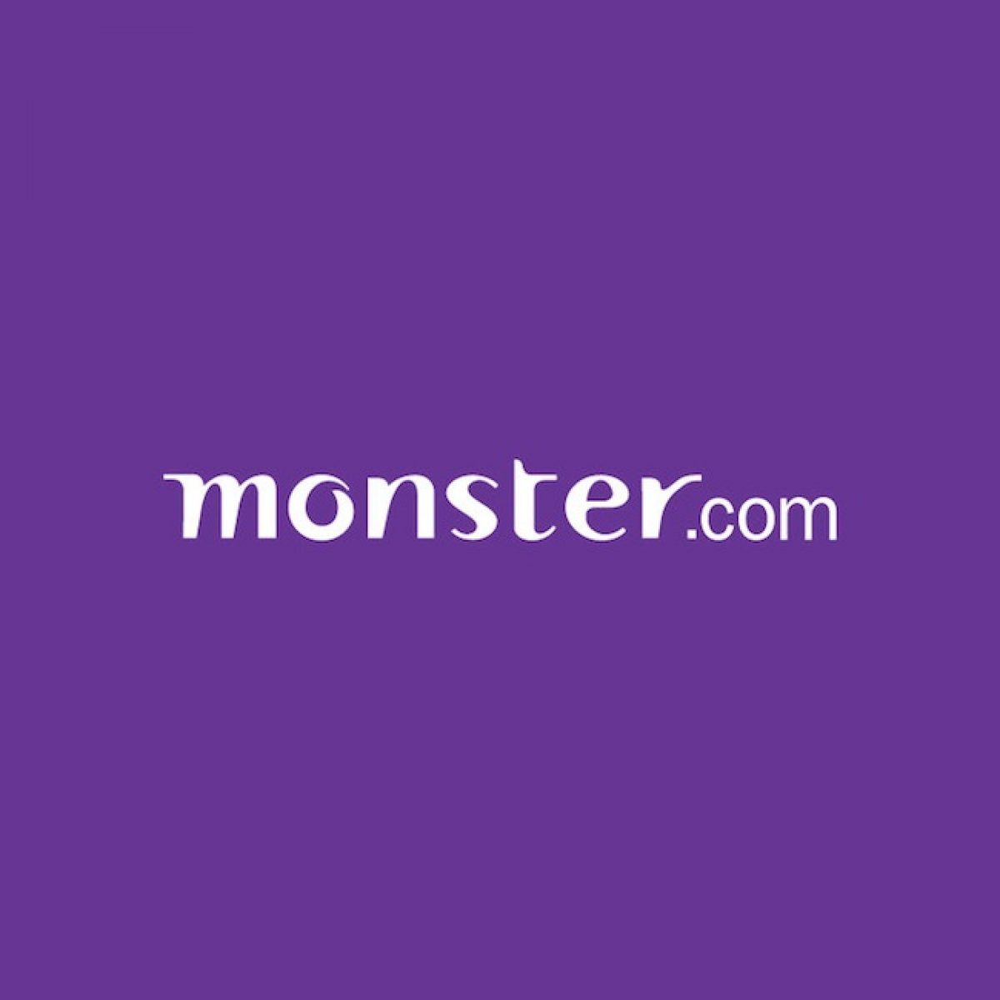

# IMPORTING IMPORTANT LIBRARIES

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

# MOUNTING GOOGLE DRIVE

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# IMPORTING THE DATA

Here i have imported the data which is in csv format



In [ ]:
df = pd.read_csv('/content/drive/MyDrive/dataset/monster_com-job_sample.csv')
df.head()

,country,country_code,date_added,has_expired,job_board,...,organization,page_url,salary,sector,uniq_id
0,United States of America,US,NaN,No,jobs.monster.com,...,NaN,http://jobview.monster.com/it-support-technici...,NaN,IT/Software Development,11d599f229a80023d2f40e7c52cd941e
1,United States of America,US,NaN,No,jobs.monster.com,...,Printing and Publishing,http://jobview.monster.com/business-reporter-e...,NaN,NaN,e4cbb126dabf22159aff90223243ff2a
2,United States of America,US,NaN,No,jobs.monster.com,...,Personal and Household Services,http://jobview.monster.com/senior-training-lea...,NaN,NaN,839106b353877fa3d896ffb9c1fe01c0
3,United States of America,US,NaN,No,jobs.monster.com,...,Altec Industries,http://jobview.monster.com/engineer-quality-jo...,NaN,Experienced (Non-Manager),58435fcab804439efdcaa7ecca0fd783
4,United States of America,US,NaN,No,jobs.monster.com,...,Retail,http://jobview.monster.com/shift-supervisor-pa...,NaN,Project/Program Management,64d0272dc8496abfd9523a8df63c184c


# VIEWING THE FULL DATA

In [ ]:
# applying this syntax i viewed full data
#pd. set_option("display.max_rows", 21999, "display.max_columns",14)
#df

#SECTION - 2

#QUESTIONS THAT I HAVE OBSERVED
1)If salary column has different types of currency then how to deal with this particulr column?

2)How to remove location from Organization column?

3)Which job or role is more or less popular?

4)How to remove organization from Location column?

5)In Location column instead of city name zip code is given how  can i  will will deal with it?

In [ ]:
df.info()
# in this syntax i will get information for this data

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 22000 entries, 0 to 21999
Data columns (total 14 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   country          22000 non-null  object
 1   country_code     22000 non-null  object
 2   date_added       122 non-null    object
 3   has_expired      22000 non-null  object
 4   job_board        22000 non-null  object
 5   job_description  22000 non-null  object
 6   job_title        22000 non-null  object
 7   job_type         20372 non-null  object
 8   location         22000 non-null  object
 9   organization     15133 non-null  object
 10  page_url         22000 non-null  object
 11  salary           3446 non-null   object
 12  sector           16806 non-null  object
 13  uniq_id          22000 non-null  object
dtypes: object(14)
memory usage: 2.3+ MB


There are many columns which have the null values, so i will have to remove those values 

In [ ]:
df=df.drop(['country','country_code','job_board','has_expired'], axis=1)


I think some columns are not required such as page_url, uniq_id so i will drop this columns

In [ ]:
df=df.drop(['page_url','uniq_id'],axis=1)

In [ ]:
df.describe()

,date_added,job_description,job_title,job_type,location,organization,salary,sector
count,122,22000,22000,20372,22000,15133,3446,16806
unique,78,18744,18759,39,8423,738,1737,163
top,9/22/2016,12N Horizontal Construction Engineers Job Desc...,Monster,Full Time,"Dallas, TX",Healthcare Services,"40,000.00 - 100,000.00 $ /year",Experienced (Non-Manager)
freq,6,104,318,6757,646,1919,50,4594


# SECTION 3

After watching this data for couple of hours in the data only date_added column are 122 values in some rows of the location column it has job_description and also salary column it has null values.






In [ ]:
l=df.location.unique()
unique_location={}
for i in range(len(l)):
    unique_location[i]=l[i]
    
    
for k in df.organization.keys():
        if  df.organization[k] in l:
            temp=df.organization[k]
            df.organization[k]=df.location[k]
            df.location[k]=temp

The Location column is also something wrong It has many unused information like job descritpion contact person job title etc To deal with this - generally the location field is city name state, and zip code so I assume the location field won't be having characters more than 20.

In [ ]:
df=df[df['location'].apply(lambda x: len(x)<20)]
location=df['location'].str.split(',')
df['location']=location.str[0]

In [ ]:
pattern = r'[A-Z/a-z]'
df=df[df['location'].str.contains(pattern)] 

In [ ]:
jobtype=df['job_type'].str.split(',')
df['job_type']=jobtype.str[0]

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [ ]:
df['job_type'][df['job_type']=='Full Time Employee']='Full Time'
df['job_type'][df['job_type']=='Part Time Employee']='Part Time'

In [ ]:
df.head(20)

,date_added,job_description,job_title,job_type,location,organization,salary,sector
0,NaN,TeamSoft is seeing an IT Support Specialist to...,IT Support Technician Job in Madison,Full Time,Madison,NaN,NaN,IT/Software Development
1,NaN,The Wisconsin State Journal is seeking a flexi...,Business Reporter/Editor Job in Madison,Full Time,Madison,Printing and Publishing,NaN,NaN
3,NaN,Why Join Altec? If you’re considering a career...,Engineer - Quality Job in Dixon,Full Time,Dixon,Altec Industries,NaN,Experienced (Non-Manager)
4,NaN,Position ID# 76162 # Positions 1 State CT C...,Shift Supervisor - Part-Time Job in Camphill,Full Time,Camphill,Retail,NaN,Project/Program Management
5,NaN,Job Description Job #: 720298Apex Systems has...,Construction PM - Charlottesville Job in Charl...,Full Time,Charlottesville,Computer/IT Services,NaN,Experienced (Non-Manager)
7,NaN,RESPONSIBILITIES:Kforce has a client seeking a...,Mailroom Clerk Job in Austin,Full Time,Austin,NaN,NaN,Experienced (Non-Manager)
8,NaN,"Part-Time, 4:30 pm - 9:30 pm, Mon - Fri Brookd...",Housekeeper Job in Austin,Part Time,Austin,Hotels and Lodging Personal and Household Serv...,NaN,Customer Support/Client Care
9,NaN,"Insituform Technologies, LLC, an Aegion compan...",Video Data Management /Transportation Technici...,NaN,Chesterfield,NaN,NaN,NaN
11,NaN,Enjoy making a great first impression? Our Sal...,Sales Associate Job in Columbus,Full Time,Columbus,Business Services - Other,NaN,Customer Support/Client Care
12,NaN,Junior ProofreaderOur client's in- house creat...,Junior Proofreader Job in Boston,Full Time,Boston,NaN,NaN,NaN


If i see the salary column there is lots of uncertinities 

1)More than 80% data is missing

2)Some employees did not mention the salary

3)Salaries are not in standard form (yearly/hourly )

4)mployers mentioned bonuses/benefits/compensation instead of numbers

5)Some employers mentioned salary based on experience
To work on this particular column, I will add NaN for the null values and concentrate only on yearly and hourly salaries.

In [ ]:
def for_hourly(val):
    if pd.isnull(val):
        return np.nan
    elif ' /hour' in val:
        i=val.split('/hour')[0].replace('$',' ').strip()
        if '-' in i:
            ab=i.split('-')[0]
            cd=i.split('-')[1]

            try:
                ab = float(ab.replace(",", "").strip())
                cd = float(cd.replace(",", "").strip())
            except:
                return np.nan
            return ab, cd
df = df.assign(hourly_salary =df['salary'].apply(for_hourly)) 

In [ ]:
def for_yearly(val):
    if pd.isnull(val):
        return np.nan
    elif ' /year' in val:
        i=val.split('/year')[0].replace('$',' ').strip()
        if '-' in i:
            ef=i.split('-')[0]
            gh=i.split('-')[1]

            try:
                ef = float(ef.replace(",", "").strip())
                gh = float(gh.replace(",", "").strip())
            except:
                return np.nan
            return ef, gh
   
df = df.assign(yearly_salary =df['salary'].apply(for_yearly))

In [ ]:
df = df.assign(salary_Y_median = df['yearly_salary'].apply
                   (lambda x: (x[0] + x[1]) / 2 if pd.notnull(x) else x),
                   salary_H_median = df['hourly_salary'].apply
                   (lambda y: (y[0] + y[1]) / 2 if pd.notnull(y) else y))

In [ ]:
df.drop(['hourly_salary'],axis = 1,inplace = True)

In [ ]:
df.drop(['yearly_salary'], axis = 1, inplace = True)

In [ ]:
df.dtypes

In [ ]:
df.isnull().sum()

In [ ]:
def impute_nan_most_frequent_category(df,ColName):
     most_frequent_category=df[ColName].mode()[0] # .mode()[0] - gives first category name
    
     df[ColName + "_Imputed"] = df[ColName] # replace nan values with most occured category
     df[ColName + "_Imputed"].fillna(most_frequent_category,inplace=True)

for Columns in ['job_type','salary']: # Call function to impute most occured category
    impute_nan_most_frequent_category(df,Columns)
    
df[['job_type','job_type_Imputed','salary']].head(10) # Display imputed result

df =df.drop(['job_type','salary'], axis = 1) # Drop actual columns

In [ ]:
df

,date_added,job_description,job_title,location,organization,...,yearly_salary,salary_Y_median,salary_H_median,job_type_Imputed,salary_Imputed
0,NaN,TeamSoft is seeing an IT Support Specialist to...,IT Support Technician Job in Madison,Madison,NaN,...,NaN,NaN,NaN,Full Time,"40,000.00 - 100,000.00 $ /year"
1,NaN,The Wisconsin State Journal is seeking a flexi...,Business Reporter/Editor Job in Madison,Madison,Printing and Publishing,...,NaN,NaN,NaN,Full Time,"40,000.00 - 100,000.00 $ /year"
3,NaN,Why Join Altec? If you’re considering a career...,Engineer - Quality Job in Dixon,Dixon,Altec Industries,...,NaN,NaN,NaN,Full Time,"40,000.00 - 100,000.00 $ /year"
4,NaN,Position ID# 76162 # Positions 1 State CT C...,Shift Supervisor - Part-Time Job in Camphill,Camphill,Retail,...,NaN,NaN,NaN,Full Time,"40,000.00 - 100,000.00 $ /year"
5,NaN,Job Description Job #: 720298Apex Systems has...,Construction PM - Charlottesville Job in Charl...,Charlottesville,Computer/IT Services,...,NaN,NaN,NaN,Full Time,"40,000.00 - 100,000.00 $ /year"
7,NaN,RESPONSIBILITIES:Kforce has a client seeking a...,Mailroom Clerk Job in Austin,Austin,NaN,...,NaN,NaN,NaN,Full Time,"40,000.00 - 100,000.00 $ /year"
8,NaN,"Part-Time, 4:30 pm - 9:30 pm, Mon - Fri Brookd...",Housekeeper Job in Austin,Austin,Hotels and Lodging Personal and Household Serv...,...,NaN,NaN,NaN,Part Time,"40,000.00 - 100,000.00 $ /year"
9,NaN,"Insituform Technologies, LLC, an Aegion compan...",Video Data Management /Transportation Technici...,Chesterfield,NaN,...,NaN,NaN,NaN,Full Time,"40,000.00 - 100,000.00 $ /year"
11,NaN,Enjoy making a great first impression? Our Sal...,Sales Associate Job in Columbus,Columbus,Business Services - Other,...,NaN,NaN,NaN,Full Time,"40,000.00 - 100,000.00 $ /year"
12,NaN,Junior ProofreaderOur client's in- house creat...,Junior Proofreader Job in Boston,Boston,NaN,...,NaN,NaN,NaN,Full Time,"40,000.00 - 100,000.00 $ /year"


In [ ]:
new_data = df[['job_title','organization','salary_Y_median','salary_H_median']]

In [ ]:
new_data.head()

In [ ]:
new_data['salary_Y_median'].fillna((new_data['salary_Y_median'].median()), inplace=True)
new_data['salary_H_median'].fillna((new_data['salary_H_median'].median()), inplace=True)

In [ ]:
new_data['job_title'] = LabelEncoder().fit_transform(df['job_title'])
new_data[['job_title']]

In [ ]:
new_data.head()

,job_title,organization,salary_Y_median,salary_H_median
0,5397,NaN,67500.0,17.5
1,1557,Printing and Publishing,67500.0,17.5
3,3602,Altec Industries,67500.0,17.5
4,11349,Retail,67500.0,17.5
5,2360,Computer/IT Services,67500.0,17.5


In [ ]:
new_data['organization'] = LabelEncoder().fit_transform(df['organization'])
new_data[['organization']]

ValueError: ignored

In [ ]:
new_data[['job_title','organization','salary_Y_median','salary_H_median']].head()

,job_title,organization,salary_Y_median,salary_H_median
0,5397,NaN,67500.0,17.5
1,1557,Printing and Publishing,67500.0,17.5
3,3602,Altec Industries,67500.0,17.5
4,11349,Retail,67500.0,17.5
5,2360,Computer/IT Services,67500.0,17.5
